In [1]:
from pathlib import Path
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import math
import seaborn as sns
from collections import OrderedDict
sns.set()

# Preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import QuantileTransformer
# Algorithms
from minisom import MiniSom

DATA_DIR = Path('../data')
PROC_DIR = Path(DATA_DIR / 'original/processed')

flow_columns = ['R [Rsun]', 'B [G]', 'alpha [deg]']

# Helper Functions

In [2]:
def plot_som_results(som_x, som_y, win_map):
    fig, axs = plt.subplots(som_x,som_y,figsize=(25,25))
    for x in range(som_x):
        for y in range(som_y):
            cluster = (x,y)
            if cluster in win_map.keys():
                for series in win_map[cluster]:
                    axs[cluster].plot(series,c="gray",alpha=0.5) 
                axs[cluster].plot(np.average(np.vstack(win_map[cluster]),axis=0), c="red", linewidth=0.5)
            cluster_number = x*som_y+y+1
            axs[cluster].set_title(f"Cluster {cluster_number}")
    plt.tight_layout()
    plt.show()
    
def plot_unscaled_clusters(cluster_dict, flows_dict, columns):
    """Plot cluster of the original data (not scaled)"""    
    names = list(flows_dict.keys())
    clusters = sorted(list(cluster_dict.items())) # sort by cluster id
    for cluster_id, cluster in clusters:
        fig, axs = plt.subplots(1, len(columns), figsize=(15, 5))
        fig.suptitle(f'Cluster {cluster_id}')
        for filename in cluster:
            for col_pos, col in enumerate(columns):
                ax = axs[col_pos]
                ax.plot(flows_dict[filename][col], linewidth=0.5)
                ax.set(ylabel=col)
        plt.tight_layout()
        plt.show()

# Load data

In [3]:
filenames = [f for f in PROC_DIR.iterdir()]

flows_dict = OrderedDict()
for f in filenames:
    flows_dict[f.stem] = pd.read_csv(f, skiprows=2, usecols=['R [Rsun]', 'B [G]', 'alpha [deg]'])
        
    

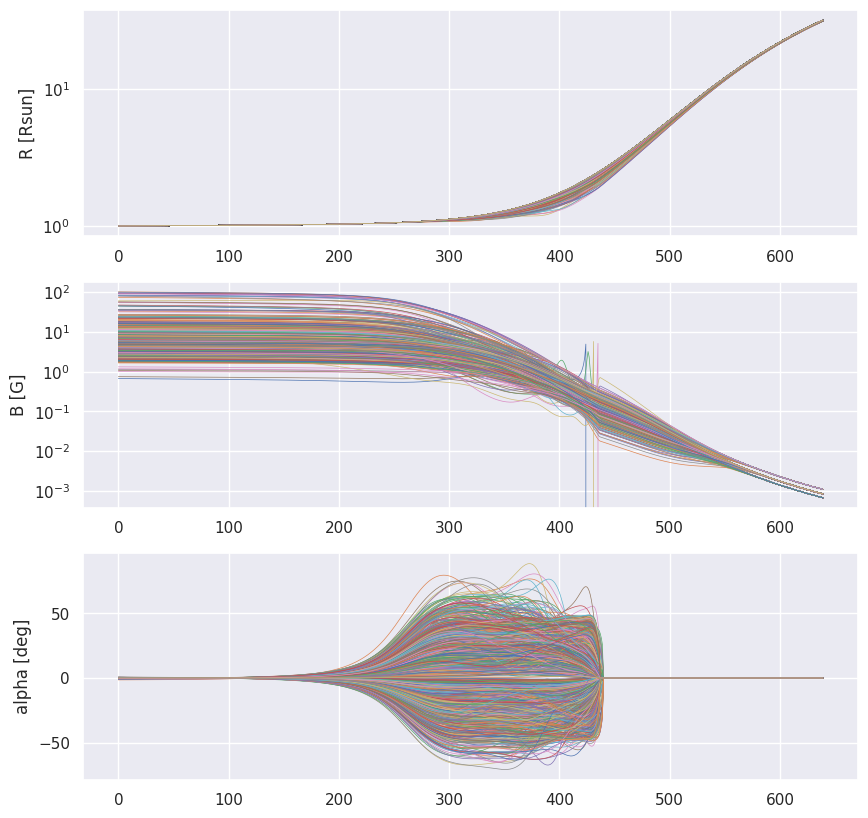

In [4]:
fig, axs = plt.subplots(3, 1, figsize=(10, 10))
for idx, col in enumerate(flow_columns):
    for series in flows_dict.values():
        axs[idx].plot(series.index, series[col], linewidth=0.5)
        
axs[0].set_ylabel('R [Rsun]')
axs[1].set_ylabel('B [G]')
axs[2].set_ylabel('alpha [deg]')

axs[0].set_yscale('log')
axs[1].set_yscale('log')
# axs[2].set_yscale('symlog')


## Scale Inputs

In [5]:
scaled_flows = pd.DataFrame()
scaler = QuantileTransformer(n_quantiles=1000, output_distribution='uniform')

for series in flows_dict.values():
    scaled_flows = pd.concat([scaled_flows, series], axis=0)

scaler.fit(scaled_flows)
scaled_flows = scaler.transform(scaled_flows)


scaled_flows = pd.DataFrame(scaled_flows, columns=flow_columns)
print(scaled_flows.shape)
print(scaled_flows.head())
# scaler.fit(scaled_flows)


(754560, 3)
   R [Rsun]     B [G]  alpha [deg]
0  0.000000  0.946853     0.238447
1  0.003003  0.946837     0.238614
2  0.004895  0.946821     0.238785
3  0.006006  0.946806     0.238959
4  0.008008  0.946790     0.239137


# Magnetic Field - B [G]

In [6]:
# separate into file series
scaled_magnetic = [scaled_flows['B [G]'][i*640 : i*640 + 640] for i in range(len(scaled_flows['B [G]']) // 640)]
scaled_magnetic = np.array(scaled_magnetic)
scaled_magnetic[0][:5]


array([0.94685306, 0.94683727, 0.94682145, 0.9468056 , 0.94678972])

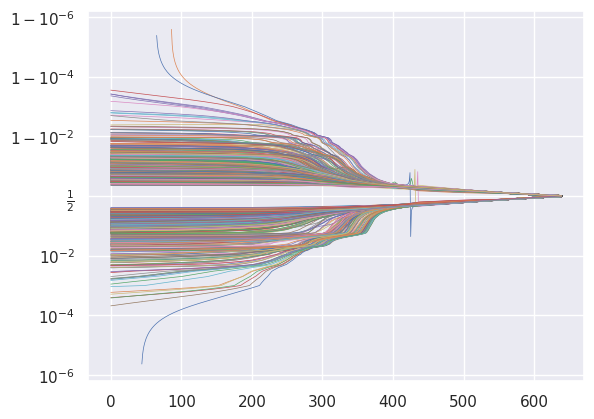

In [7]:
# plot scaled magnetic field
for b_line in scaled_magnetic:
    plt.plot(b_line, linewidth=0.5)

plt.yscale('logit')

## SOM

In [8]:
# rule of thumb number of clusters for SOM is the sqrt of the sqrt of the number of data points
som_x = som_y = math.ceil(math.sqrt(math.sqrt(len(scaled_magnetic))))
som = MiniSom(som_x, som_y, 640, sigma=0.3, learning_rate = 0.1)

train_x = list(scaled_magnetic)

som.random_weights_init(train_x)
som.train(train_x, 50000, verbose=True)

 [ 50000 / 50000 ] 100% - 0:00:00 left 
 quantization error: 0.19312068744804262


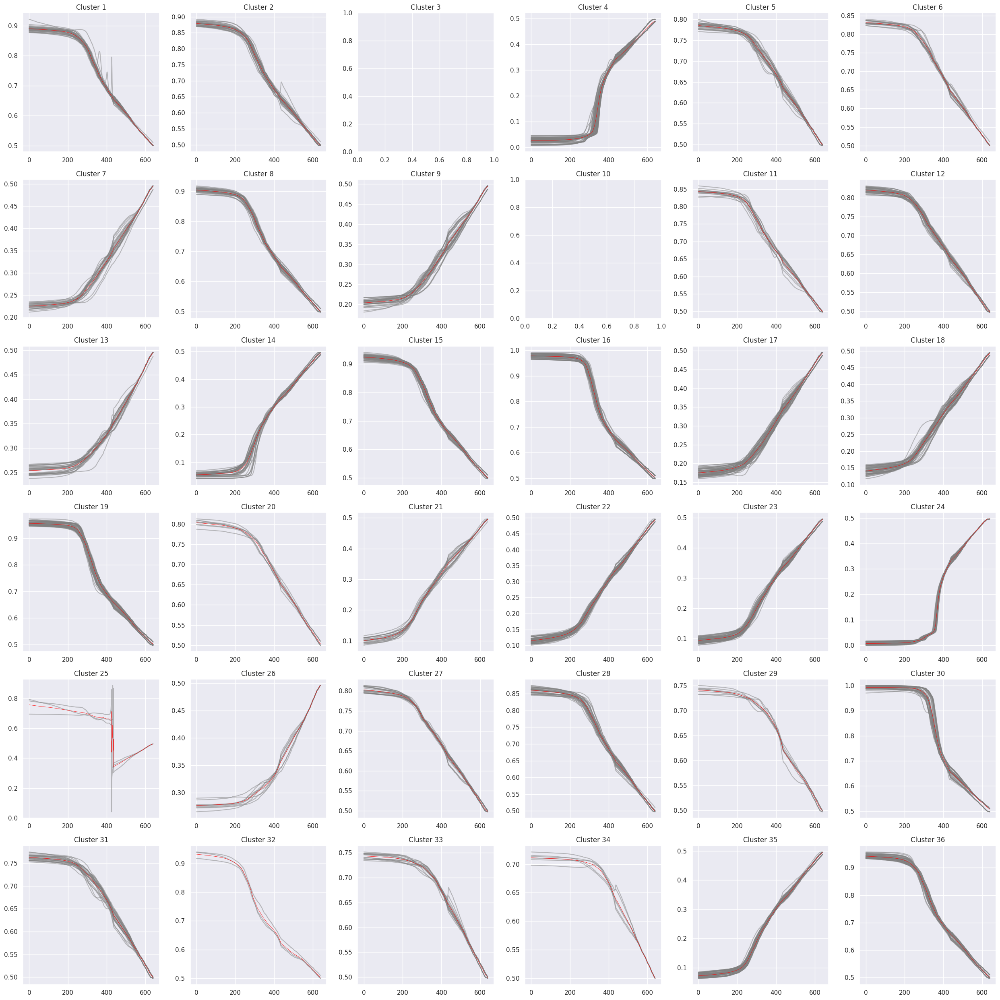

In [9]:
win_map = som.win_map(train_x)
plot_som_results(som_x, som_y, win_map)

### Original data clusters

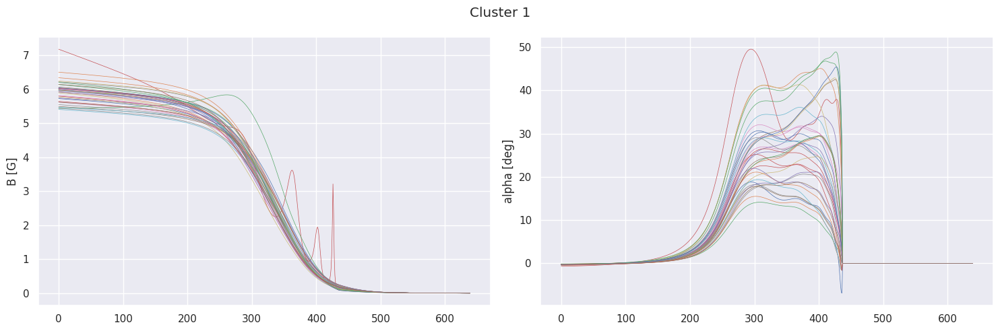

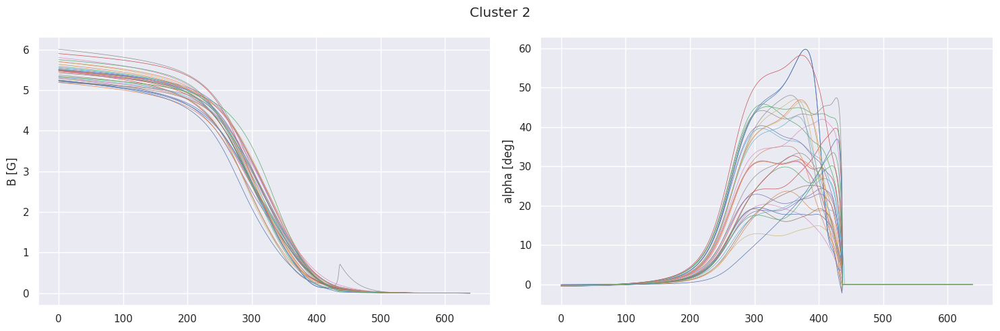

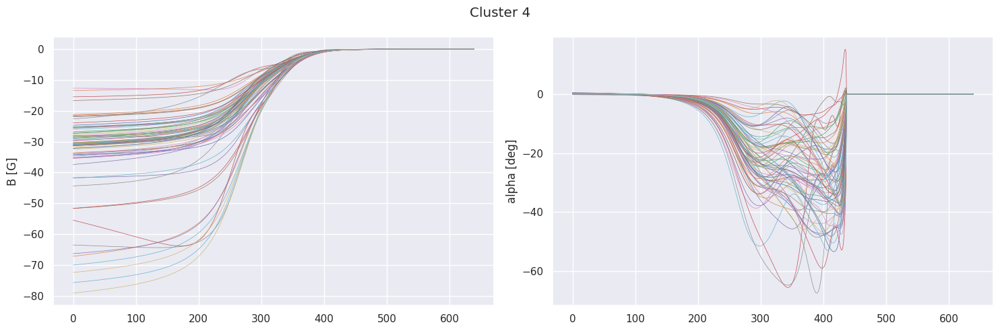

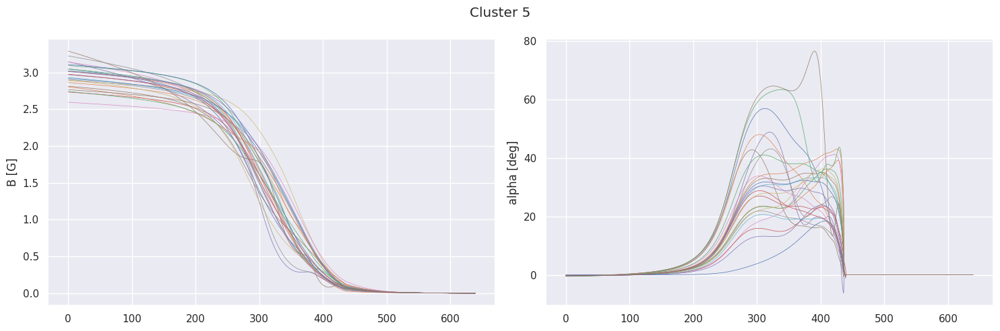

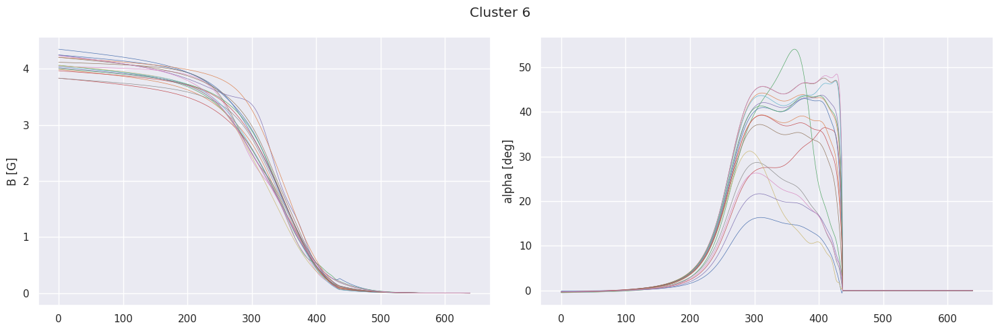

...

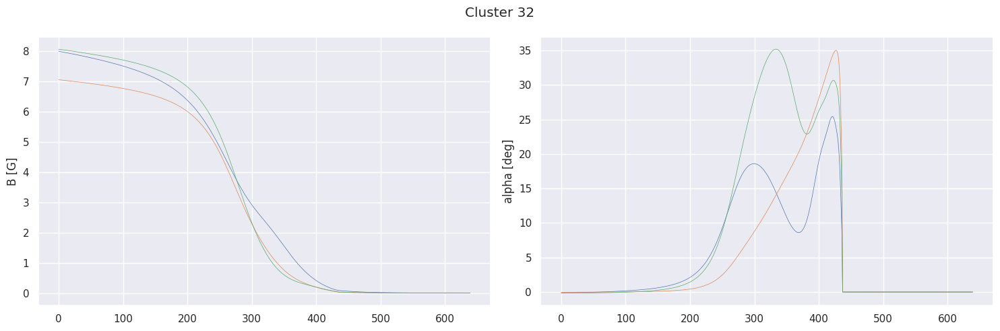

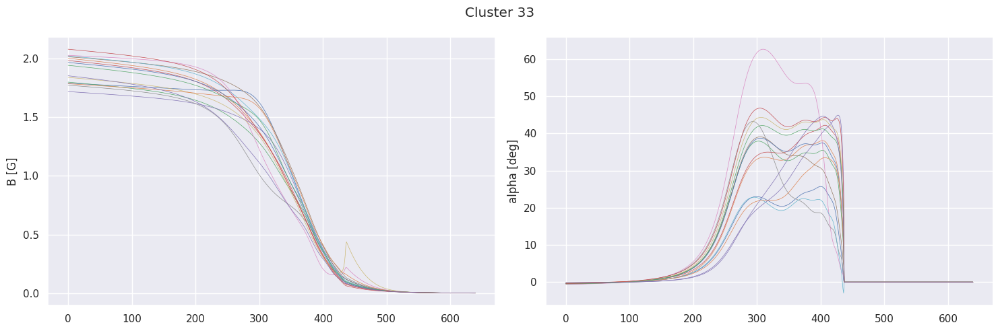

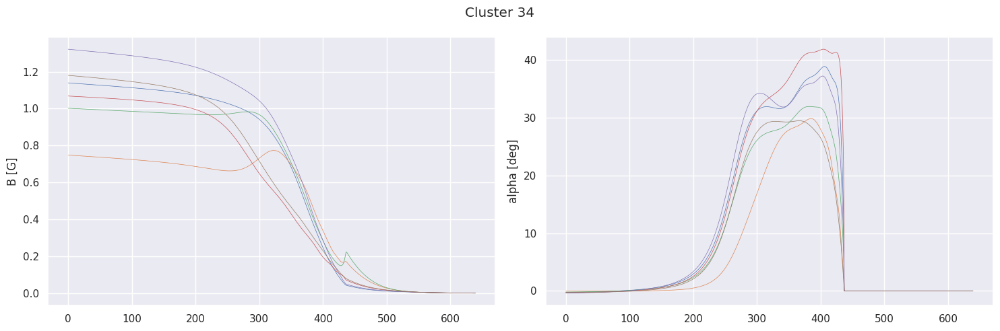

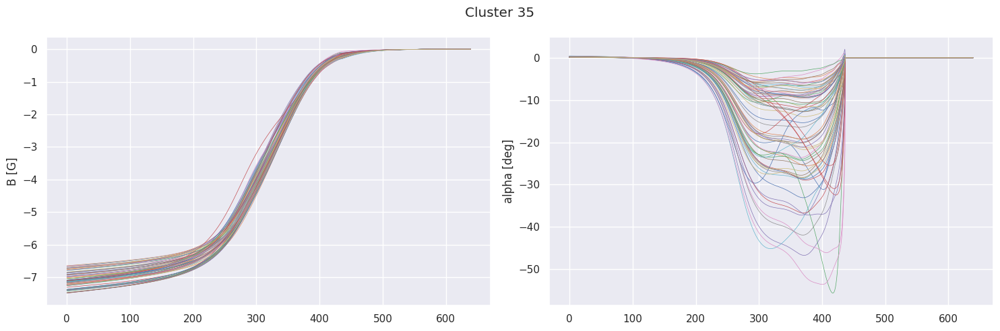

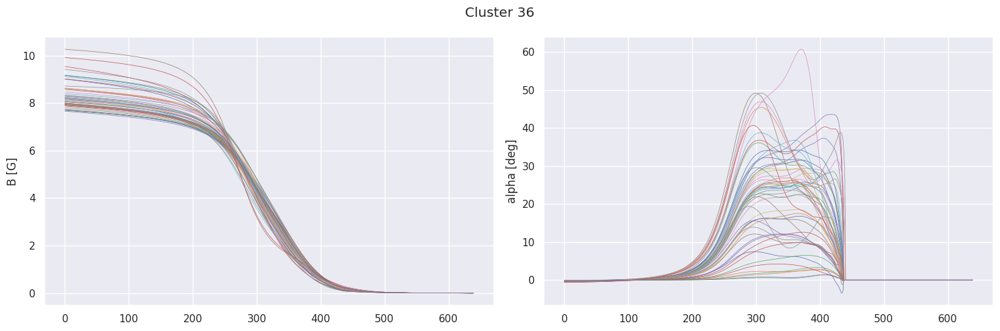

In [10]:
# display unscaled data into clusters
filenames = list(flows_dict.keys())

magnetic_clusters = OrderedDict()
for idx, scaled in enumerate(scaled_magnetic):
    winner_node = som.winner(scaled)
    magnetic_clusters.setdefault(winner_node[0]*som_y + winner_node[1] + 1, list()).append(filenames[idx])
    
plot_unscaled_clusters(magnetic_clusters, flows_dict, flow_columns[1:])
    

### Cluster Distributions

[Text(0.5, 0, 'Cluster'), Text(0, 0.5, 'Number of files')]

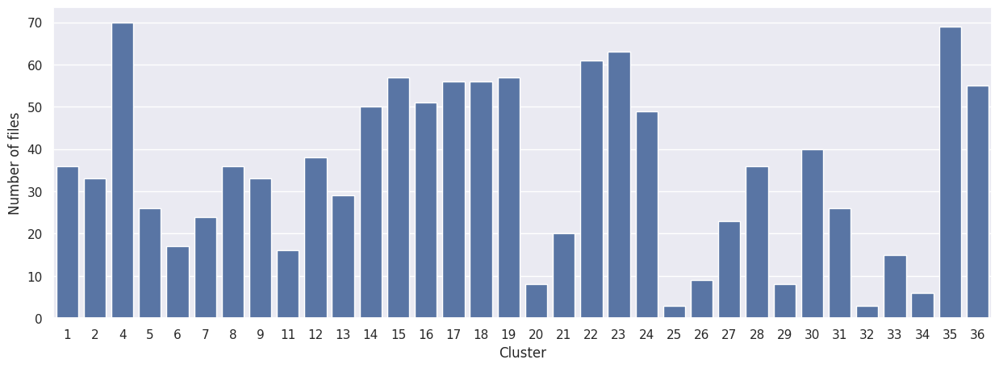

In [26]:
fig, ax = plt.subplots(figsize=(15, 5))
bp = sns.barplot(x=list(magnetic_clusters.keys()), y=[len(v) for v in magnetic_clusters.values()], ax=ax, color='b')
bp.set(xlabel='Cluster', ylabel='Number of files')

# Flux Tube Inclination - alpha [deg]

In [11]:
# separate into file series
scaled_alpha = [scaled_flows['alpha [deg]'][i*640 : i*640 + 640] for i in range(len(scaled_flows['alpha [deg]']) // 640)]
scaled_alpha = np.array(scaled_alpha)
scaled_alpha[0][:5]


array([0.23844706, 0.23861429, 0.23878495, 0.23895907, 0.2391367 ])

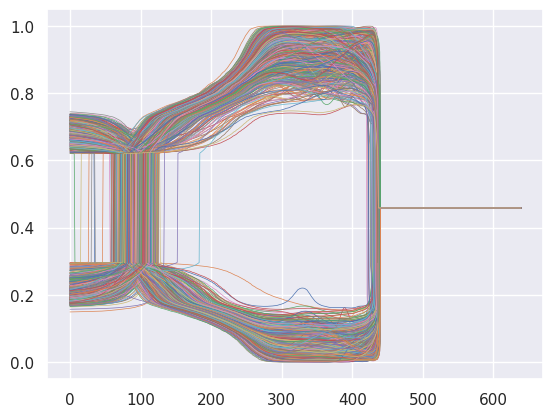

In [12]:
# plot scaled magnetic field
for a_line in scaled_alpha:
    plt.plot(a_line, linewidth=0.5)

plt.yscale('linear')

## SOM

In [13]:
# rule of thumb number of clusters for SOM is the sqrt of the sqrt of the number of data points
som_x = som_y = math.ceil(math.sqrt(math.sqrt(len(scaled_alpha))))
som = MiniSom(som_x, som_y, 640, sigma=0.3, learning_rate = 0.1)

train_x = list(scaled_alpha)

som.random_weights_init(train_x)
som.train(train_x, 50000, verbose=True)

 [ 50000 / 50000 ] 100% - 0:00:00 left 
 quantization error: 0.6532715803456852


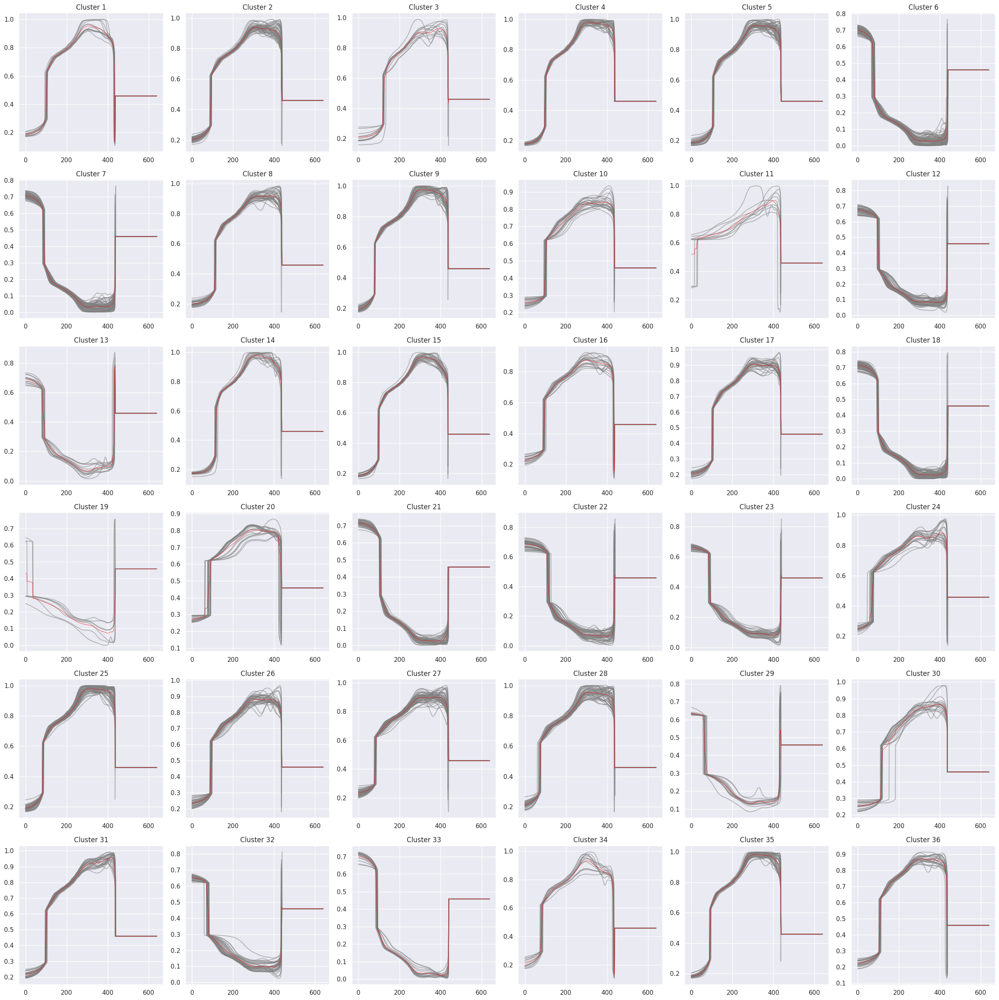

In [14]:
win_map = som.win_map(train_x)
plot_som_results(som_x, som_y, win_map)

### Original Data Clusters

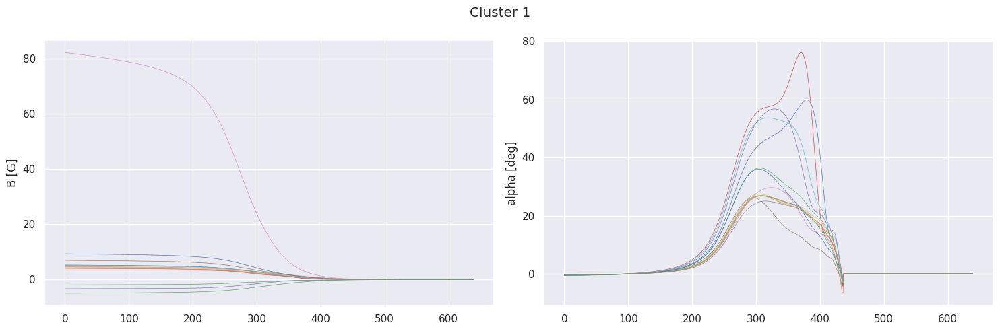

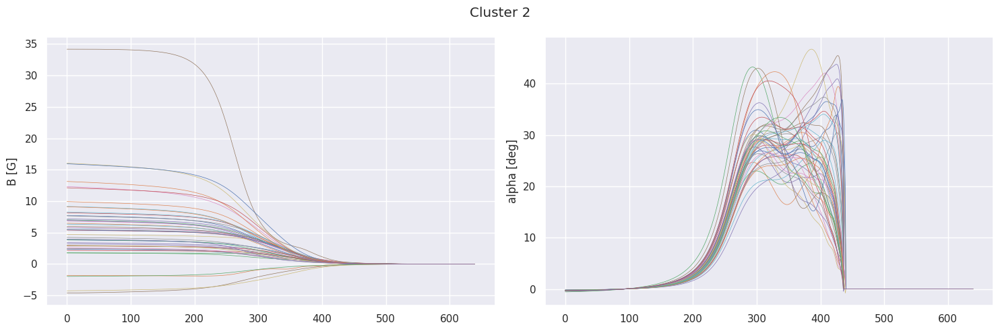

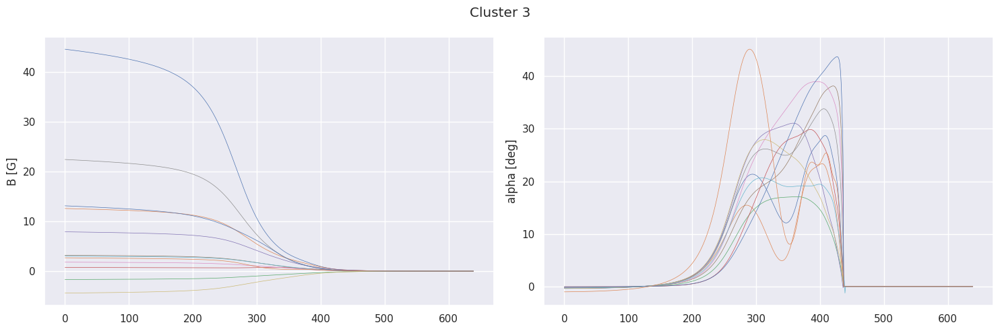

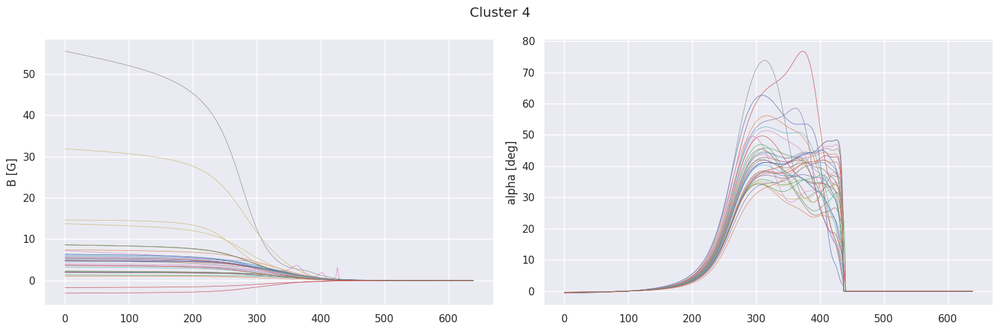

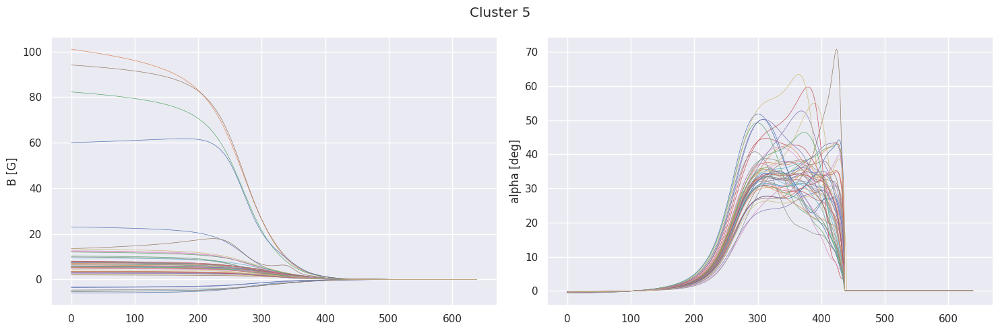

...

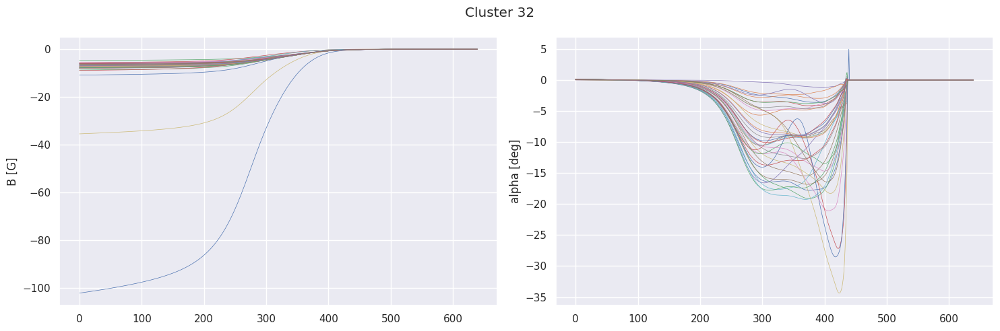

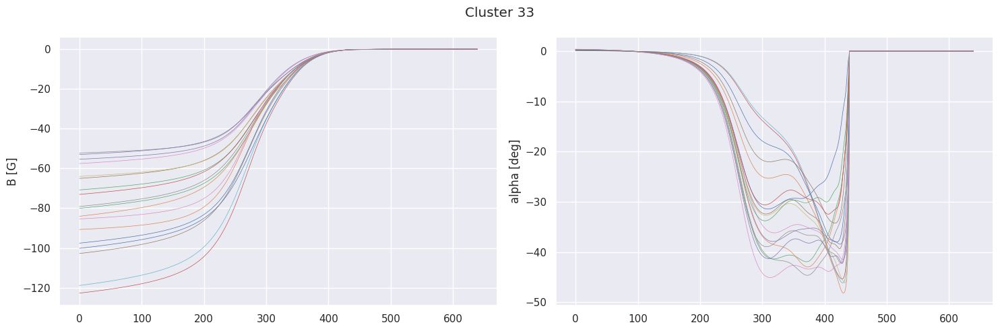

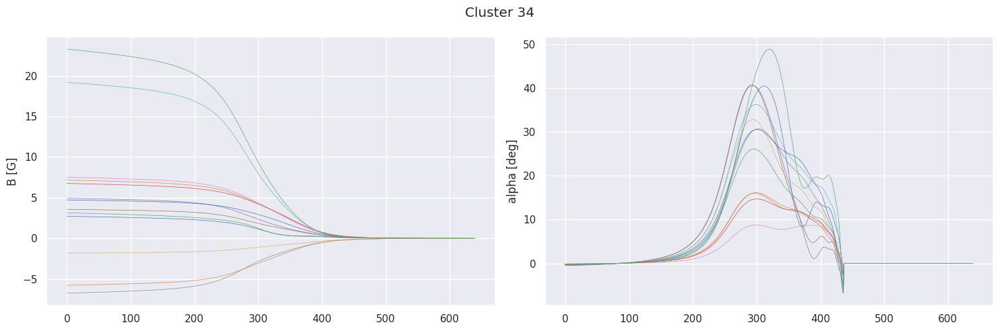

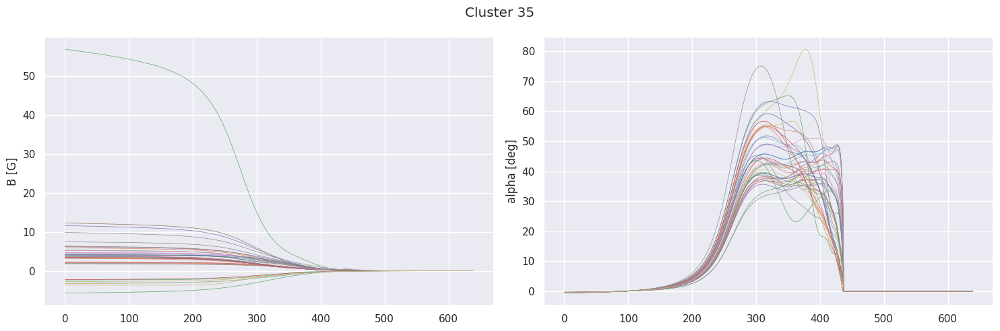

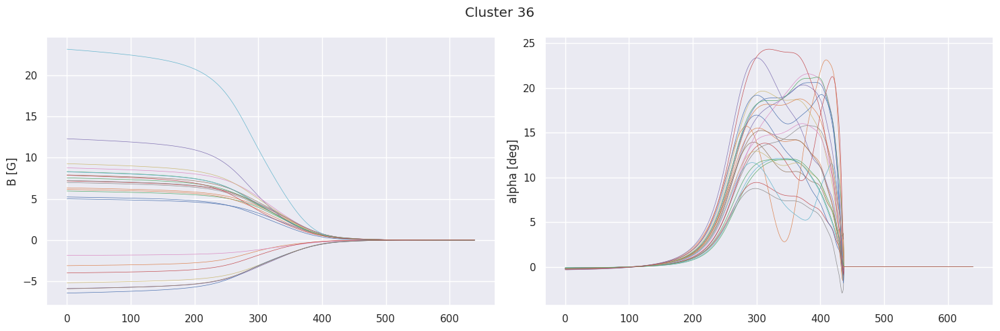

In [15]:
# display unscaled data into clusters
filenames = list(flows_dict.keys())

alpha_clusters = OrderedDict()
for idx, scaled in enumerate(scaled_alpha):
    winner_node = som.winner(scaled)
    alpha_clusters.setdefault(winner_node[0]*som_y + winner_node[1] + 1, list()).append(filenames[idx])
    
plot_unscaled_clusters(alpha_clusters, flows_dict, flow_columns[1:])

### Cluster Distribution

[Text(0.5, 0, 'Cluster'), Text(0, 0.5, 'Number of files')]

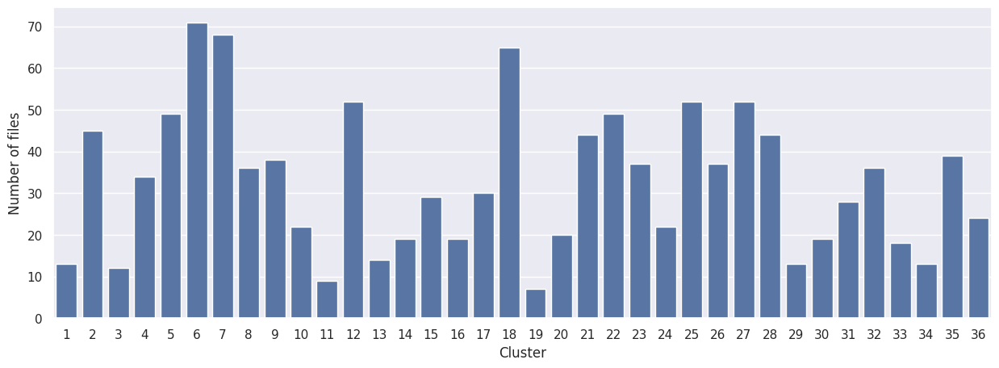

In [27]:
fig, ax = plt.subplots(figsize=(15, 5))
bp = sns.barplot(x=list(alpha_clusters.keys()), y=[len(v) for v in alpha_clusters.values()], ax=ax, color='b')
bp.set(xlabel='Cluster', ylabel='Number of files')